# PCA on UKBB Meshes

In [1]:
%load_ext autoreload
%autoreload 1

In [5]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import pandas as pd

import os
os.system('/usr/bin/Xvfb :99 -screen 0 1024x768x24 &')
os.environ['DISPLAY'] = ':99'

import panel as pn
pn.extension('vtk')

import pyvista as pv
pv.set_plot_theme("document")

# from coma.datasets.ukbb_meshdata import UKBBMeshDataset
# from coma.utils import transforms
from coma.utils.decomposition import PCAShapeModel3D, GraphSpectralFiltering
from coma.utils.visualise import plot_single_mesh, plot_mesh, plot_mesh_pyvista, plot_meshes_pyvista

In [3]:
%aimport coma.utils.decomposition, coma.utils.visualise

In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Load Dataset

In [7]:
brain_substructure = 'BrStem'

In [8]:
# from coma.datasets.ukbb_meshdata import UKBBMeshDataset, VerticesDataLoader
# from coma.utils import transforms

# # Preprocessor
# preprocessor = transforms.get_transforms()

# brain_substructure = 'BrStem'

# # Load Dataset
# mesh_path = "/vol/biomedic3/bglocker/brainshapes"
# cache_path = "/vol/bitbucket/rrr2417/deepscm_data_cache"
# csv_path = "/vol/biomedic3/bglocker/brainshapes/ukb21079_extracted.csv"
# split = 0.8

# substructure_to_udi = {
#     'BrStem': '25025-2.0', 
#     'L_Thal': '25011-2.0',
#     'L_Caud': '25013-2.0',
#     'L_Puta': '25015-2.0',
#     'L_Pall': '25017-2.0',
#     'L_Hipp': '25019-2.0',
#     'L_Amyg': '25021-2.0',
#     'L_Accu': '25023-2.0',
#     'R_Thal': '25012-2.0',
#     'R_Caud': '25014-2.0',
#     'R_Puta': '25016-2.0',
#     'R_Pall': '25018-2.0',
#     'R_Hipp': '25020-2.0',
#     'R_Amyg': '25022-2.0',
#     'R_Accu': '25024-2.0',
# }

# feature_name_map = {
#     '31-0.0': 'sex',
#     '21003-0.0': 'age',
#     substructure_to_udi[brain_substructure]: 'structure_volume',  # Brain Stem
#     '25010-2.0': 'brain_volume',  # Unnormalised brain volume from UKBB
# }

# metadata_df = pd.read_csv(csv_path)

# total_train_dataset = UKBBMeshDataset(
#     mesh_path,
#     substructures=[brain_substructure],
#     split=split,
#     train=True,
#     transform=preprocessor,
#     reload_path=True,
#     features_df=metadata_df,
#     feature_name_map=feature_name_map,
#     cache_path=cache_path,
# )

# val_split = 0.1
# total_train_length = len(total_train_dataset)
# val_length = int(val_split * total_train_length)
# train_length = total_train_length - val_length

# train_dataset, val_dataset = torch.utils.data.random_split(
#     total_train_dataset,
#     lengths=[train_length, val_length],
#     generator=torch.Generator().manual_seed(42),
# )

# data = [train_dataset[i] for i in range(len(train_dataset))]
# meshes = torch.cat([mesh for (mesh, _) in data], 0).detach().numpy()
# print(meshes.shape)
# metadata_df = pd.concat([df for (_, df) in data], 0)
# print(metadata_df.shape)
# metadata_df.head()

# torch.save(meshes, 'training_meshes.pt')
# metadata_df.to_csv('training_metadata.csv')

In [9]:
meshes = torch.load('training_meshes.pt')
features = pd.read_csv('training_metadata.csv')

print(meshes.shape)
features.head()

(10441, 642, 3)


,Unnamed: 0,eid,sex,age,structure_volume,brain_volume
0,8809,3820915,0,56,23764,1041180
1,11675,3677460,1,66,22000,1143400
2,9633,4383421,1,63,27148,1369520
3,8374,3069151,0,59,20223,980627
4,14213,1457636,0,50,21183,1386220


In [10]:
path = '/vol/biomedic3/bglocker/brainshapes/ukb21079_extracted.csv'
metadata_df_full = pd.read_csv(path)
mask = metadata_df_full.eid.isin(features.eid.values)
metadata_df_full = metadata_df_full[mask]

/vol/bitbucket/rrr2417/deepscm/ENV2/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3155: DtypeWarning: Columns (255,273,274,275,279,351,451,452,453,454,1344,1347,1350,1351,1352,1396,1397,1398,1399,1400,1401,1402,1428,1429,1430,1431,1432,1433,1434,1492,1596,1597,1598,1599,1600,1601,1602,1603,1604,1605,1606,1607,1608,1609,1610,1611,1612,1613,1614,1615,1616,1968,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030,2031,2032,2033,2034,2035,2036,2037,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047,2048,2049,2050,2051,2052,2053,2054,2055,2056,2057,2058,2059,2060,2061,2062,2063,2064,2065,2066,2431) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [11]:
len(metadata_df_full) 

10441

In [12]:
template_path = '/vol/biomedic3/bglocker/brainshapes/5026976/T1_first-BrStem_first.vtk'
template = pv.read(template_path)
faces = template.faces.T.reshape(-1, 4)[:, 1:]

### Sanity Check

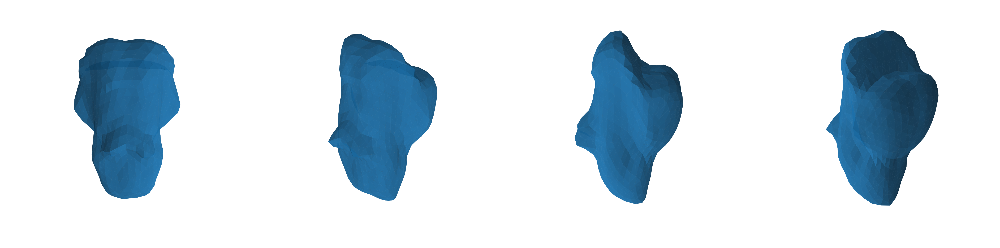

In [12]:
from scipy.spatial.transform import Rotation as R

axis_scaling = [1, 1, 1.5]

rot_transform = R.from_rotvec([0, 0, np.pi * 0.5])
mean_mesh = meshes.mean(axis=0)
mean_mesh = rot_transform.apply(mean_mesh)

plot_mesh(
    mean_mesh,
    faces,
    figsize=(80, 50),
    elevations=[20],
    azimuths=4,
    max_azimuth=180,
    axis_scaling=axis_scaling,
    hide_grid=True,
    antialias=True,
)

## Shape Modelling

In [13]:
shape_model = coma.utils.decomposition.PCAShapeModel3D()
shape_model.fit(meshes)

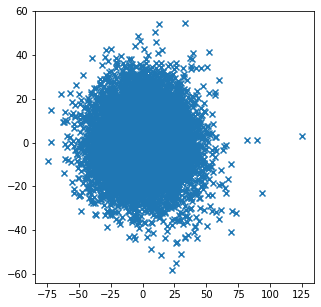

In [14]:
meshes_2d_proj = shape_model.project(meshes, dim=2)
plt.figure(figsize=(5, 5))
plt.scatter(
    meshes_2d_proj[:, 0],
    meshes_2d_proj[:, 1],
    marker='x'
)
plt.show()

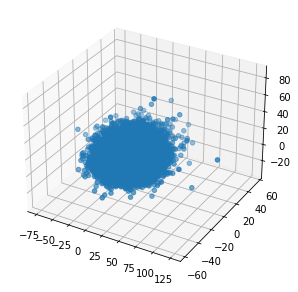

In [15]:
meshes_3d_proj = shape_model.project(meshes, dim=3)
plt.figure(figsize=(5, 5))
ax = plt.axes(projection='3d')
ax.scatter3D(
    meshes_3d_proj[:, 0],
    meshes_3d_proj[:, 1],
    meshes_3d_proj[:, 2],
)
plt.show()

### PCA Shape Model

#### All Shapes

In [30]:
shape_model = PCAShapeModel3D()
shape_model.fit(meshes)

Mode: 1


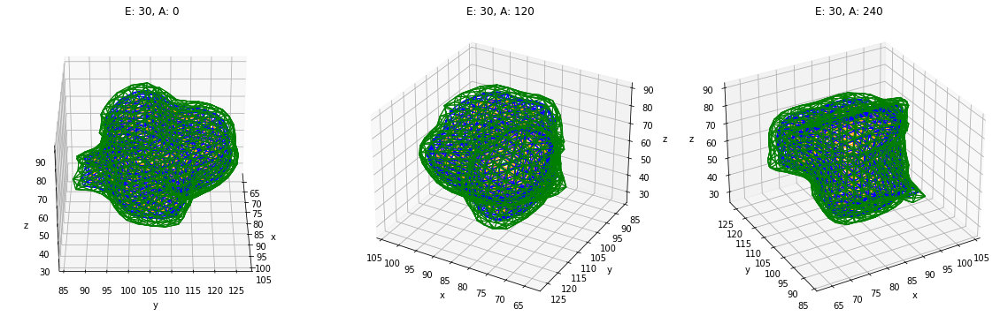

Mode: 2


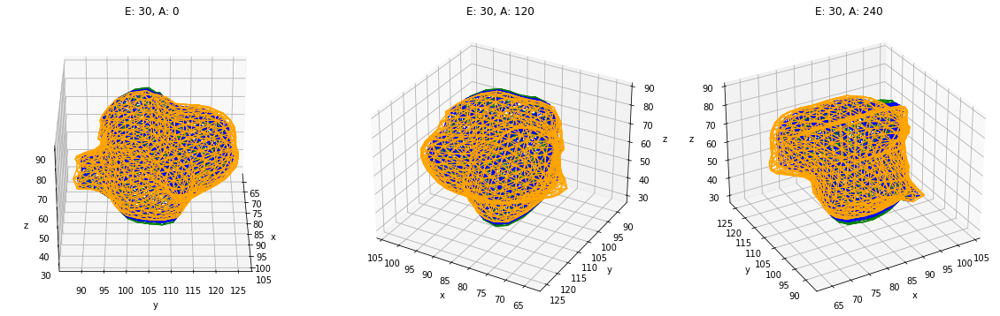

In [23]:
for mode in range(0, 2):
    print(f'Mode: {mode + 1}')
    (mode_1_pos, mode_1_neg) = shape_model.mode(mode, 3)
    mode_1 = np.concatenate([
        np.expand_dims(mode_1_pos, 0),
        np.expand_dims(shape_model.mean, 0),
        np.expand_dims(mode_1_neg, 0),
    ])
    edge_colors = ['orange', 'blue', 'green']
    labels = ['+ve', 'mean', '-ve']
    coma.utils.visualise.plot_wireframes(
        mode_1,
        faces,
        elevations=[30],
        azimuths=3,
        edge_colors=edge_colors,
        labels=labels,
    )

Mode: 1


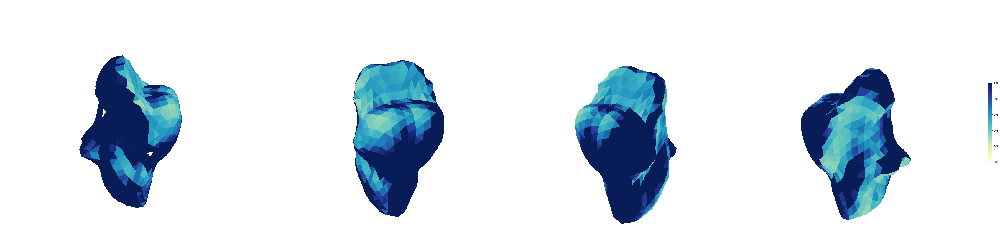

Mode: 2


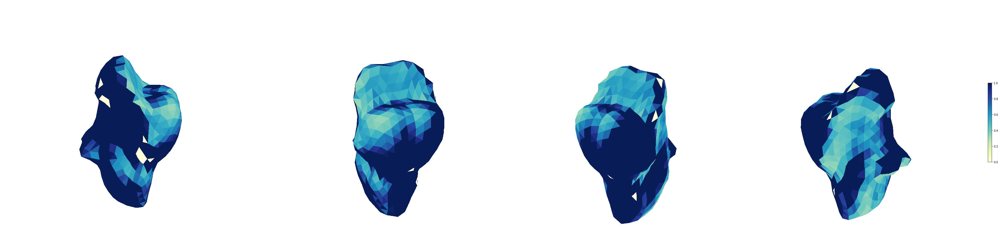

In [24]:
import coma.utils.mesh_sampling

ref_normals = coma.utils.mesh_sampling.get_face_normals(shape_model.mean, faces)
ref_normals.shape

for mode in range(0, 2):
    print(f'Mode: {mode + 1}')
    (mode_pos, _) = shape_model.mode(mode, 1)
    mode_normals = coma.utils.mesh_sampling.get_face_normals(mode_pos, faces)
    diff = coma.utils.mesh_sampling.face_normals_similarity(ref_normals, np.expand_dims(mode_normals, 0))
    plot_mesh(
        shape_model.mean,
        faces,
        figsize=(50, 20),
        elevations=[20],
        azimuths=4,
        max_azimuth=270,
        axis_scaling=[1, 1, 1.5],
        alpha=1,
        edgecolor=None,
        facecolors=diff,
        hide_grid=True,
        ax_lims=[(70, 110), (85, 125), (35, 100)],
    )

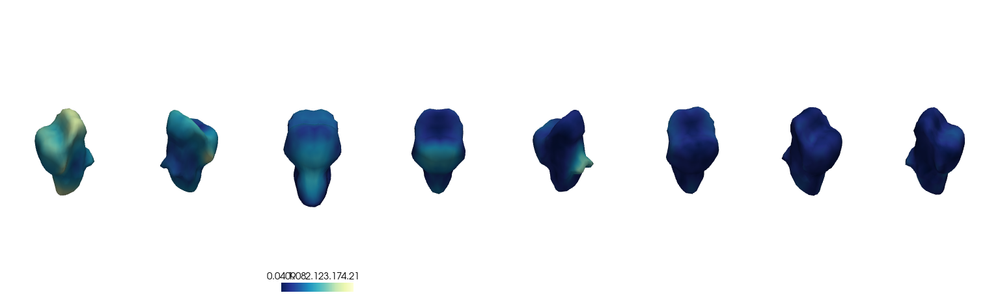

[(225.12910989657797, 342.08930604002563, 266.0517448601642),
 (17.76028044159175, 134.72047658503942, 58.68291540517801),
 (0.0, 0.0, 1.0)]

In [58]:
template_copy = template.copy()
template_copy.points = shape_model.mean

modes = 8
diff_maps = np.zeros((modes, 642))

for mode in range(0, modes):
    (mode_pos, _) = shape_model.mode(mode, 3)
    dist = np.linalg.norm(shape_model.mean - mode_pos, axis=1)
    diff_maps[mode] = dist
    
width = 768 * 2
height = int(width / (1.618 * 2))

# pv.rcParams['multi_rendering_splitting_position'] = 0.5

rotations = [(0, 0, 240), (0, 0, 85), (45, 0, -45), (0, 0, -45), (0, 0, 190), 
             (0, 0, -30), (0, 0, 10), (0, 0, 30),]

plotter = pv.Plotter(
    shape=(1, modes),
    window_size=(width, height),
    border=False,
    lighting='light_kit',
    off_screen=True,
    notebook=True,
)

colors = np.zeros_like(diff_maps)
for i in range(0, modes):
    colors[i] = diff_maps[i]

plot_meshes_pyvista(
    plotter,
    [template_copy] * modes,
    rotations=rotations,
    vertexcolors=colors,
    vertexscalar='distance',
    smooth_shading=True,
    scalar_bar_idx=2,
    titles=[''] * modes,
)

plotter.show(screenshot='shape_modes_brain_stem.png')

[autoreload of coma.utils.decomposition failed: Traceback (most recent call last):
  File "/vol/bitbucket/rrr2417/deepscm/ENV2/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/vol/bitbucket/rrr2417/deepscm/ENV2/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 410, in superreload
    update_generic(old_obj, new_obj)
  File "/vol/bitbucket/rrr2417/deepscm/ENV2/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 347, in update_generic
    update(a, b)
  File "/vol/bitbucket/rrr2417/deepscm/ENV2/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 317, in update_class
    update_instances(old, new)
  File "/vol/bitbucket/rrr2417/deepscm/ENV2/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 276, in update_instances
    refs = gc.get_referrers(old)
KeyboardInterrupt
]


/vol/biomedic3/bglocker/brainshapes/5026976/T1_first-BrStem_first.vtk


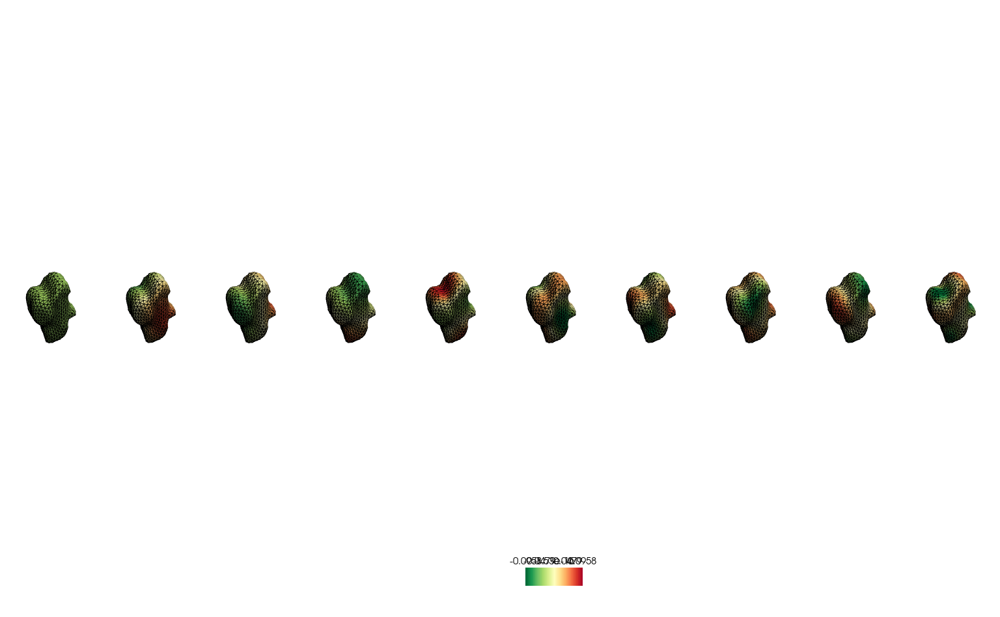

[(558.6908584400358, 380.73132856332677, 572.2909217640104),
 (48.9626350402832, -128.99689483642578, 62.56269836425781),
 (0.0, 0.0, 1.0)]

In [80]:
width = 768 * 2
height = int(width / (1.618))

# pv.rcParams['multi_rendering_splitting_position'] = 0.5

# 2, 3, 4, 1, 2
rotations = [(0, 0, 240)] # ,(0, 0, -45), (0, 0, 190), (0, 0, 240), (0, 0, 85),]

# from scipy.sparse.csgraph import laplacian as graph_laplacian
# from scipy.linalg import eigh

# from coma.utils.mesh_sampling import get_adj_matrix

substr_file = 'T1_first-BrStem_first.vtk'
_template_path = f'/vol/biomedic3/bglocker/brainshapes/5026976/{substr_file}'
print(_template_path)
_template = pv.read(_template_path)
_verts = _template.points
_faces = _template.faces.T.reshape(-1, 4)[:, 1:]

modes = 10

spectral_filter = GraphSpectralFiltering(_verts.shape[0], 'sym_scaled')
spectral_filter.fit(_faces)
mesh_proj = -spectral_filter.project(_verts, dim=modes)

plotter = pv.Plotter(
    shape=(1, modes),
    window_size=(width, height),
    border=False,
    lighting='light_kit',
    off_screen=True,
    notebook=True,
)

coma.utils.visualise.plot_meshes_pyvista(
    plotter,
    [_template] * modes,
    rotations=rotations * modes,
    vertexcolors=spectral_filter.e_vecs[:, :modes].T,
    vertexscalar='distance',
    smooth_shading=True,
    scalar_bar_idx=5,
    titles=[''] * modes,
    show_edges=True,
    cmap='RdYlGn',
)

plotter.show(screenshot='spectral_modes_brain_stem.png')

/vol/biomedic3/bglocker/brainshapes/5026976/T1_first-BrStem_first.vtk


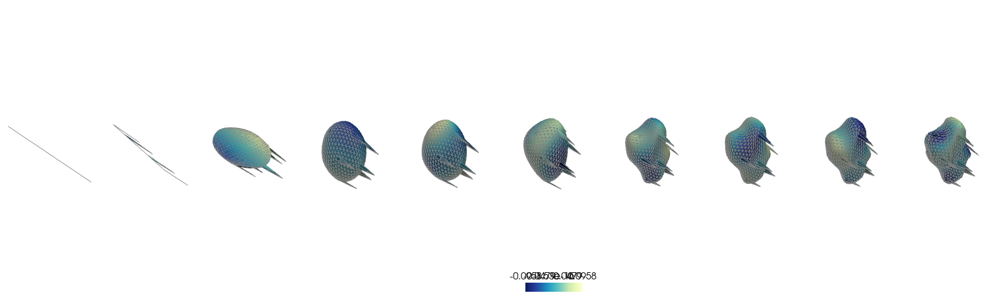

[(307.5066074057769, 131.86806095076219, 320.24723757414097),
 (50.05437675173892, -125.5841697032758, 62.79500692010297),
 (0.0, 0.0, 1.0)]

In [75]:
width = 768 * 2
height = int(width / (1.618 * 2))

pv.rcParams['multi_rendering_splitting_position'] = 0.5

# 2, 3, 4, 1, 2
rotations = [(0, 0, 240)] # ,(0, 0, -45), (0, 0, 190), (0, 0, 240), (0, 0, 85),]

from scipy.sparse.csgraph import laplacian as graph_laplacian
from scipy.linalg import eigh

from coma.utils.mesh_sampling import get_adj_matrix

substr_file = 'T1_first-BrStem_first.vtk'
_template_path = f'/vol/biomedic3/bglocker/brainshapes/5026976/{substr_file}'
print(_template_path)
_template = pv.read(_template_path)
_verts = _template.points
_faces = _template.faces.T.reshape(-1, 4)[:, 1:]

modes = [1, 2, 3, 4, 5, 10, 50, 100, 200, 300]

adj = get_adj_matrix(_verts, _faces)
norm_lap, diag = graph_laplacian(
    adj,
    normed=True,
    return_diag=True,
)

# Check that the 1st eigenvalue is close to 0
_eigenval, _eigenvec = eigh(norm_lap)
np.testing.assert_allclose(_eigenval[0], 0, atol=1e-10)

scaled_norm_lap = ((2 * norm_lap) / _eigenval.max()) - np.eye(norm_lap.shape[0])
eigenval, eigenvec = eigh(scaled_norm_lap)

mesh_projs = np.zeros((len(modes), *_verts.shape))
vertices = []

for i in modes:
    lap_approx = eigenvec[:, :i] @ np.diag(eigenval[:i]) @ eigenvec[:, :i].T
    mesh_proj = np.zeros((_verts.shape[0], _verts.shape[1]))
    mesh_proj[:, 0] = lap_approx @ _verts[:, 0]
    mesh_proj[:, 1] = lap_approx @ _verts[:, 1]
    mesh_proj[:, 2] = lap_approx @ _verts[:, 2]
    mesh_proj = -mesh_proj
    # Copy template - change vertices
    _template_copy = _template.copy()
    _template_copy.points = mesh_proj
    # mesh_projs[i] = mesh_proj.copy()
    vertices.append(_template_copy)

plotter = pv.Plotter(
    shape=(1, len(modes)),
    window_size=(width, height),
    border=False,
    lighting='light_kit',
    off_screen=True,
    notebook=True,
)
coma.utils.visualise.plot_meshes_pyvista(
    plotter,
    vertices,  # [_template] * modes,
    rotations=rotations * len(modes),
    vertexcolors=eigenvec[:, :len(modes)].T, # constant colour
    vertexscalar='distance',
    smooth_shading=True,
    scalar_bar_idx=5,
    titles=[''] * len(modes),
    show_edges=True,
#     cmap='blue',
    edge_color='gray',
    line_width=0.1,
)

plotter.show(screenshot='spectral_modes_brain_stem.png')

#### Filtered by Male vs Female

In [28]:
shape_model_sex_0 = PCAShapeModel3D()
shape_model_sex_0.fit(meshes[features.sex.values == 0])

shape_model_sex_1 = PCAShapeModel3D()
shape_model_sex_1.fit(meshes[features.sex.values == 1])

In [ ]:
# for mode in range(0, 5):
#     print(f'Mode: {mode}')
#     (mode_pos_0, mode_neg_0) = shape_model_sex_0.mode(mode, 3)
#     (mode_pos_1, mode_neg_1) = shape_model_sex_1.mode(mode, 3)
#     mode_0 = np.concatenate([
#         np.expand_dims(mode_pos_0, 0),
#         np.expand_dims(shape_model_sex_0.mean, 0),
#         np.expand_dims(mode_neg_0, 0),
#     ])
#     mode_1 = np.concatenate([
#         np.expand_dims(mode_pos_1, 0),
#         np.expand_dims(shape_model_sex_1.mean, 0),
#         np.expand_dims(mode_neg_1, 0),
#     ])
#     edge_colors = ['orange', 'blue', 'green']
#     labels = ['+ve', 'mean', '-ve']
#     print('Female')
#     plot_wireframes(
#         mode_0,
#         faces,
#         elevations=[30],
#         azimuths=3,
#         edge_colors=edge_colors,
#         labels=labels,
#     )
#     print('Male')
#     edge_colors = ['green', 'blue', 'orange']
#     plot_wireframes(
#         mode_1,
#         faces,
#         elevations=[30],
#         azimuths=3,
#         edge_colors=edge_colors,
#         labels=labels,
#     )

Mode: 1
Female


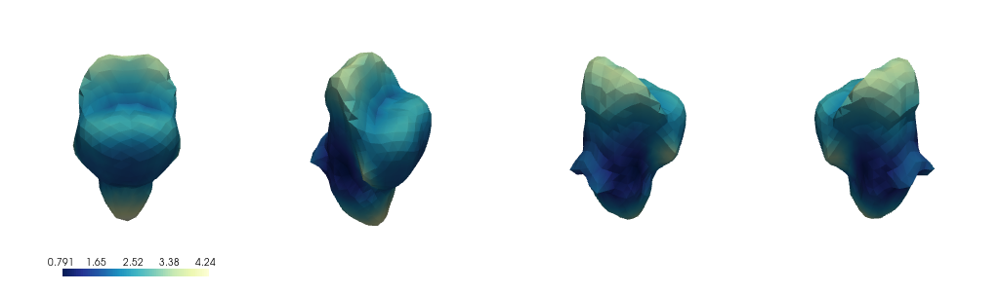

Male


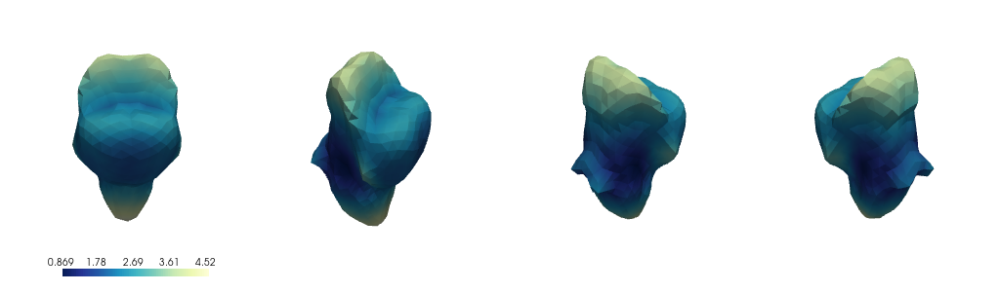

Mode: 2
Female


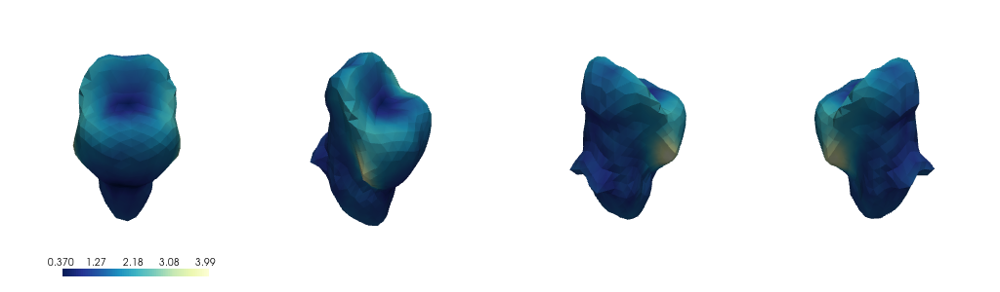

Male


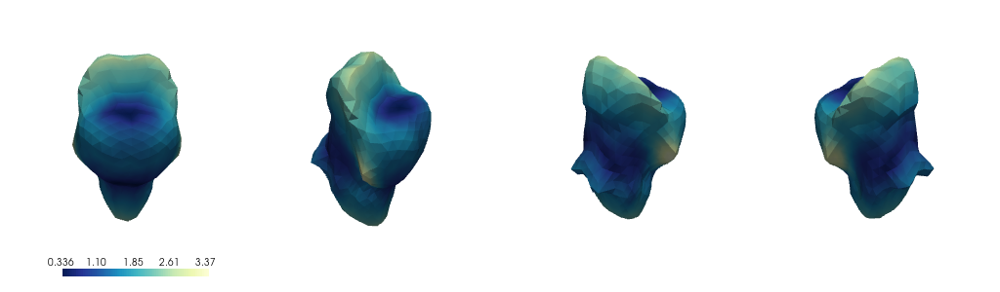

Mode: 3
Female


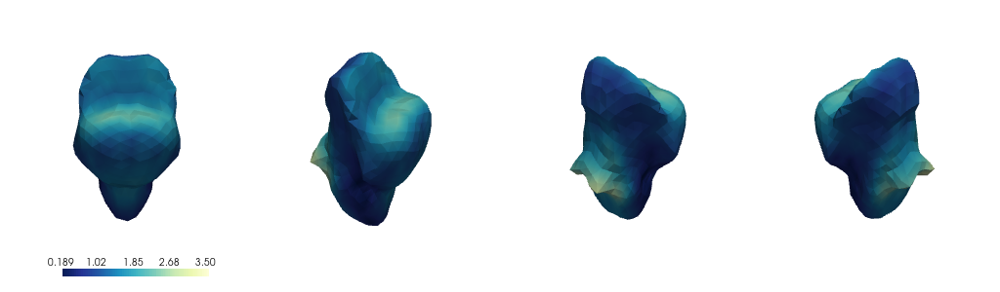

Male


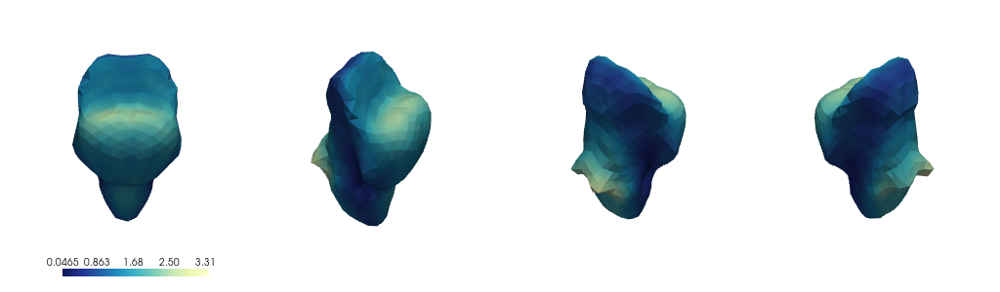

Mode: 4
Female


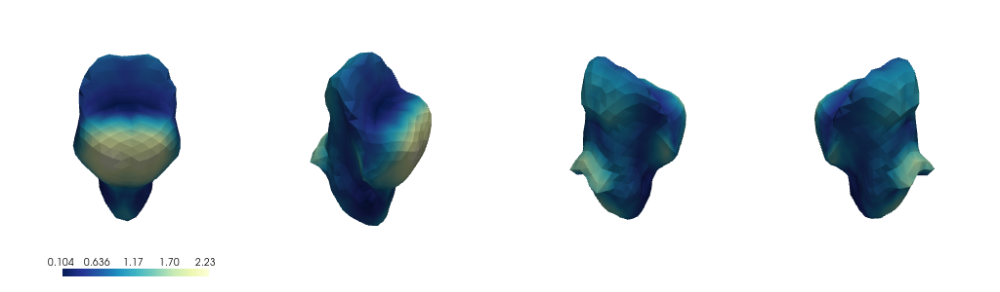

Male


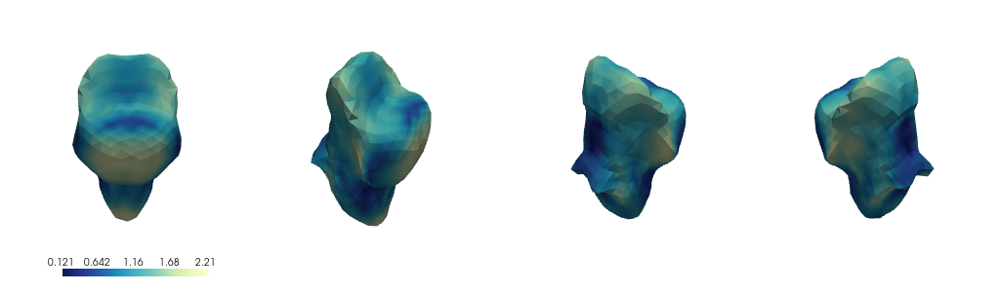

Mode: 5
Female


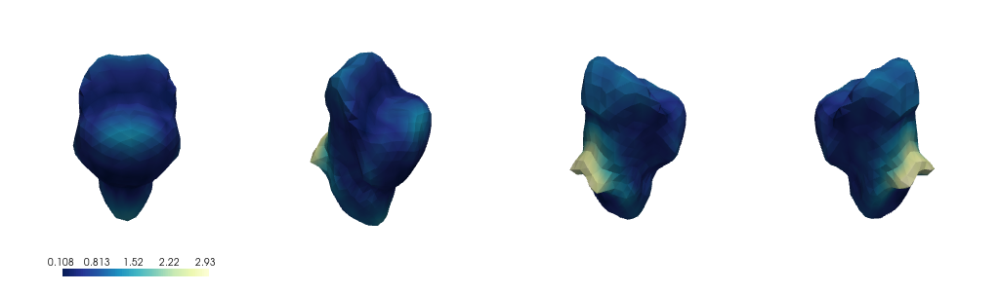

Male


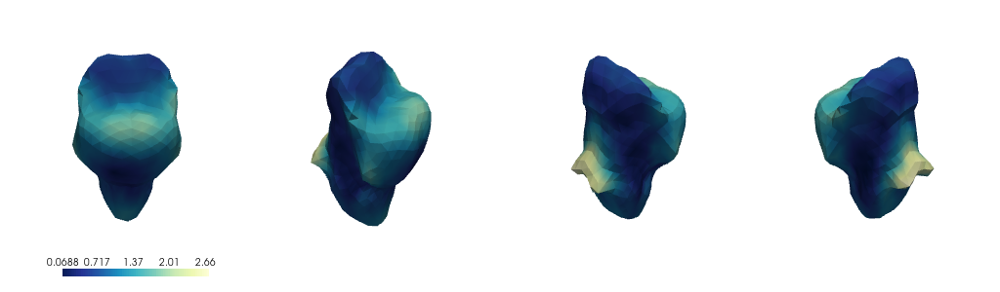

Mode: 6
Female


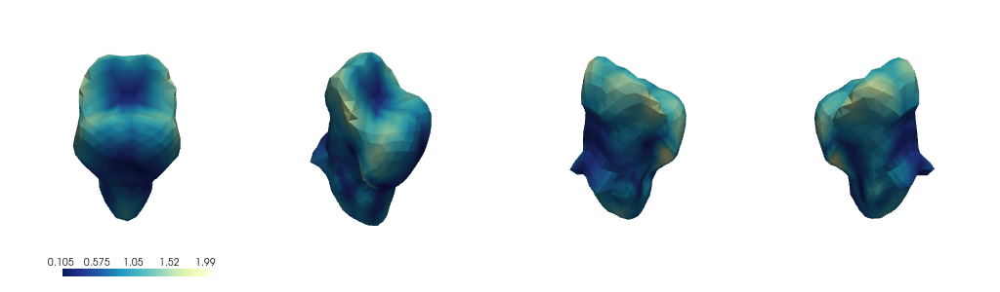

Male


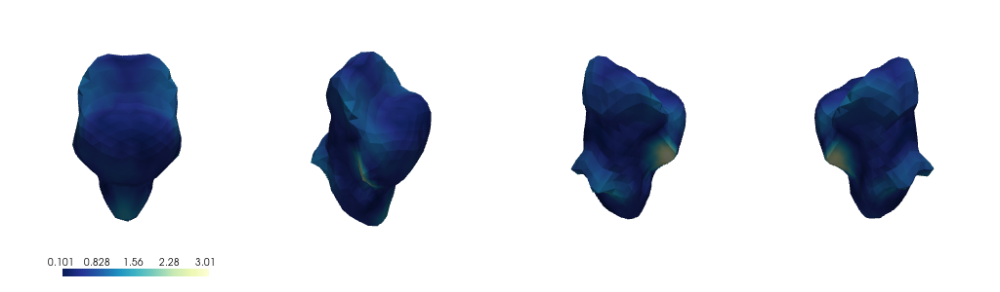

Mode: 7
Female


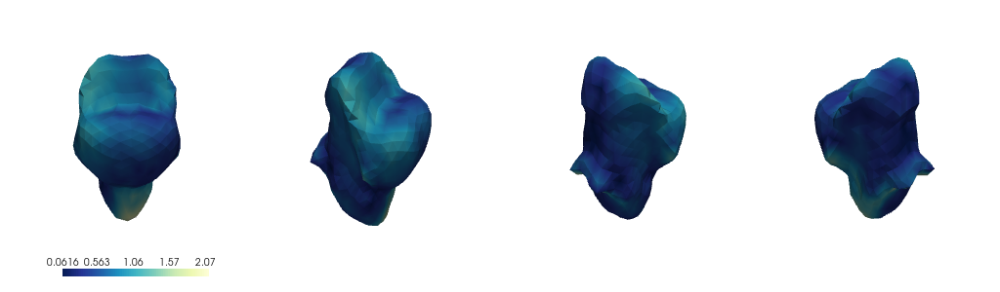

Male


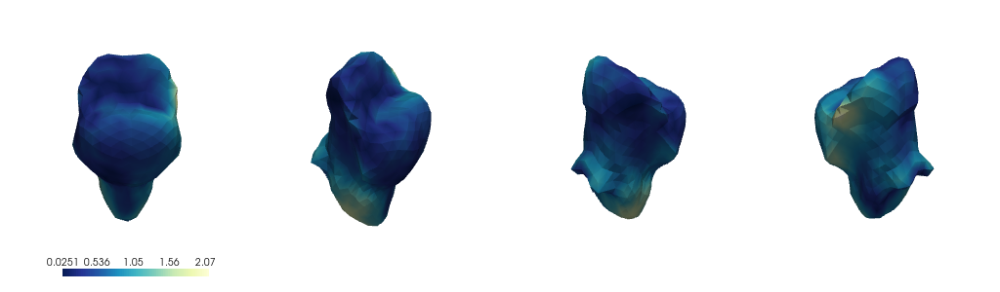

Mode: 8
Female


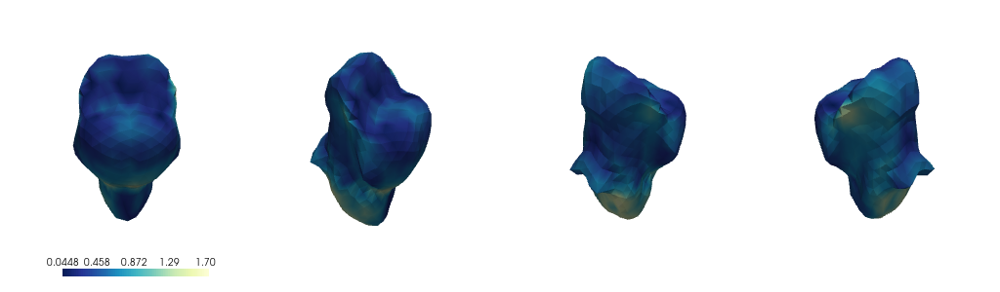

Male


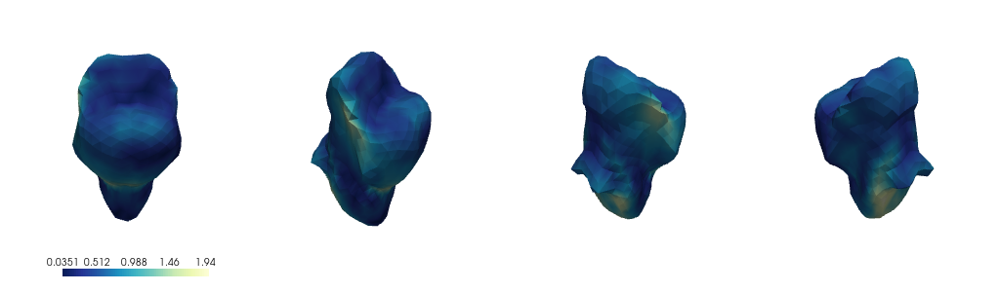

In [36]:
template_copy_male = template.copy()
template_copy_male.points = shape_model_sex_0.mean

template_copy_female = template.copy()
template_copy_female.points = shape_model_sex_1.mean

modes = 8
diff_maps = np.zeros((modes * 2, 642))  # Male and Female
#     dist = np.linalg.norm(shape_model.mean - mode_pos)

for mode in range(0, modes):
    print(f'Mode: {mode + 1}')
    
    # Females
    print('Female')
    (mode_pos, _) = shape_model_sex_0.mode(mode, 3)
    # diff_maps[mode] = np.sqrt(((shape_model.mean - mode_pos) ** 2).sum(axis=1))
    diff = np.sqrt(((shape_model.mean - mode_pos) ** 2).sum(axis=1))
    
    plotter = pv.Plotter(
        shape=(1, 4),
        window_size=(1024, 300),
        border=False,
        lighting='light_kit',
        off_screen=True,
        notebook=True,
    )
    plot_mesh_pyvista(
        plotter,
        template_copy_male,
        rotations=[(0, 0, -45), (0, 0, 20), (0, 0, 85), (0, 0, 185),],
        vertexcolors=diff,  # list(diff_maps[mode]),
        vertexscalar='distance',
    )
    plotter.show()
    
    # Male
    print('Male')
    (mode_pos, _) = shape_model_sex_1.mode(mode, 3)
    # diff_maps[mode + 1] = np.sqrt(((shape_model.mean - mode_pos) ** 2).sum(axis=1))
    diff = np.sqrt(((shape_model.mean - mode_pos) ** 2).sum(axis=1))
    
    plotter = pv.Plotter(
        shape=(1, 4),
        window_size=(1024, 300),
        border=False,
        lighting='light_kit',
        off_screen=True,
        notebook=True,
    )
    plot_mesh_pyvista(
        plotter,
        template_copy_female,
        rotations=[(0, 0, -45), (0, 0, 20), (0, 0, 85), (0, 0, 185),],
        vertexcolors=diff,  # list(diff_maps[mode + 1]),
        vertexscalar='distance',
    )
    plotter.show()
    
# diff_maps = (diff_maps - diff_maps.min()) / (diff_maps.max() - diff_maps.min())

# for mode in range(0, modes):
#     print(f'Mode: {mode + 1}')
#     
#     print('Female')

In [15]:
template_copy = template.copy()
template_copy.points = shape_model.mean

modes = 16
width = 768 * 2
height = int(width / (1.618 * 2))

rotations = [(0, 0, 240), (0, 0, 85), (45, 0, -45), (0, 0, -45),
             (0, 0, 190), (0, 0, -30), (0, 0, 10), (0, 0, 30), (0, 0, 30)]
rotations = [*rotations[:8], *rotations[1:9]]
# print(len(rotations))

plotter = pv.Plotter(
    shape=(2, modes // 2),
    window_size=(width, height),
    border=False,
    lighting='light_kit',
    off_screen=True,
    notebook=True,
)

# print(diff_maps.shape)
# print(diff_maps[:17:2].shape)
# print(np.concatenate([diff_maps[:17:2], diff_maps[1:17:2]], axis=0).shape)

plot_meshes_pyvista(
    plotter,
    [template_copy] * modes,
    rotations=rotations,
    vertexcolors=np.concatenate([diff_maps[:17:2], diff_maps[1:17:2]], axis=0),
    vertexscalar='distance',
    smooth_shading=True,
    scalar_bar_idx=2,
    titles=[''] * modes,
)

plotter.show(screenshot='shape_modes_brain_stem_by_sex.png')

NameError: name 'shape_model' is not defined

#### Filtered by Age

In [29]:
age_range = features.age.max() - features.age.min()
min_age = features.age.min()
buckets = 3
bucket_size = age_range // buckets
shape_models = {}

for i in range(buckets):
    lb = min_age + bucket_size * i
    ub = min_age + bucket_size * (i + 1)
    # print(lb, ub)
    mask = (features.age.values >= lb) & (features.age.values < ub)
    meshes_bucket = meshes[mask]
    shape_models[(lb, ub)] = coma.utils.decomposition.PCAShapeModel3D()
    # print(meshes_bucket.shape)
    shape_models[(lb, ub)].fit(meshes_bucket)

Mode: 0
(40, 50)


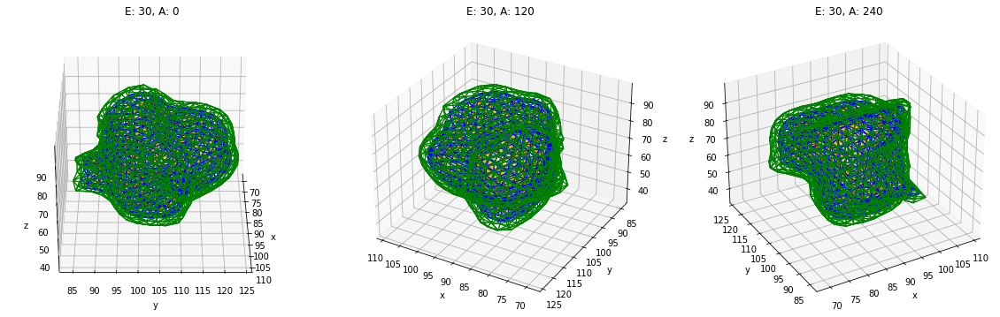

(50, 60)


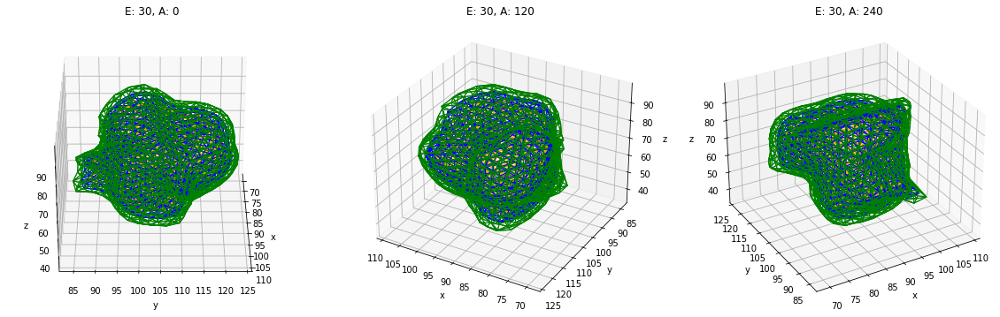

(60, 70)


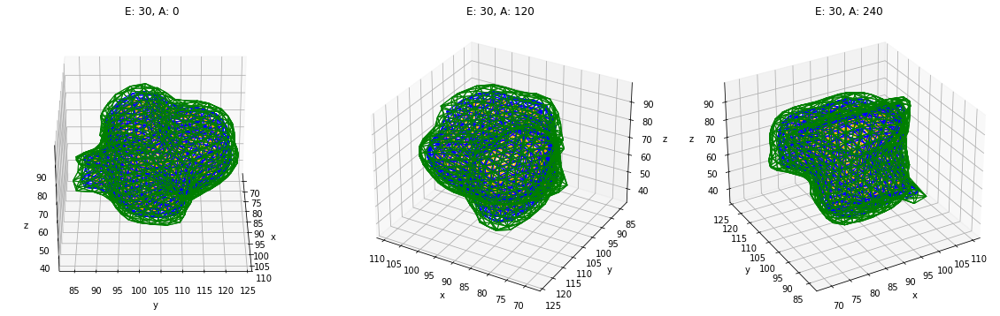

Mode: 1
(40, 50)


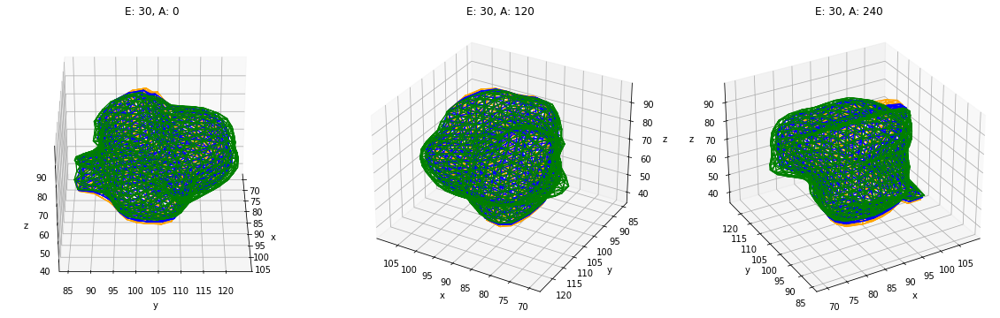

(50, 60)


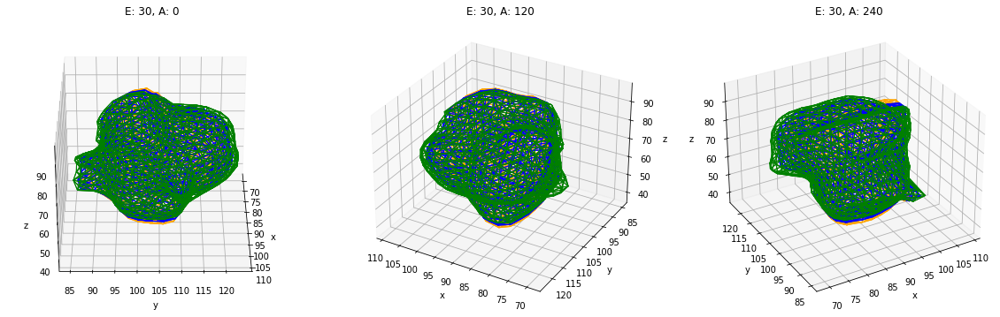

(60, 70)


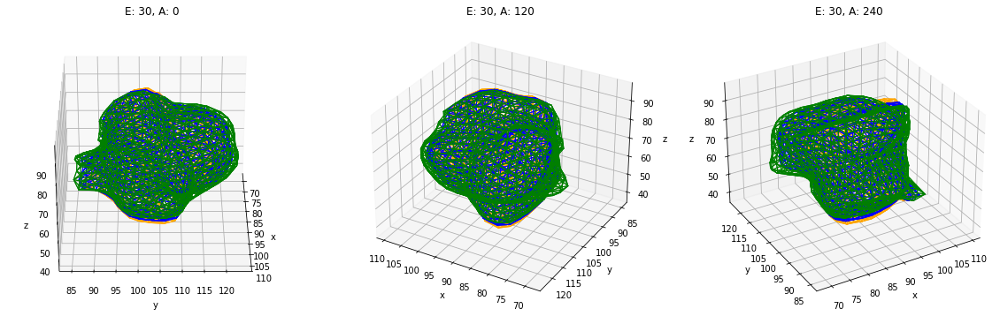

Mode: 2
(40, 50)


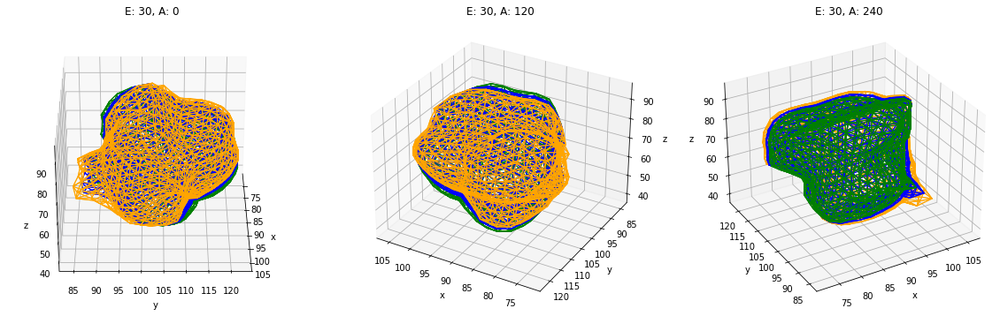

(50, 60)


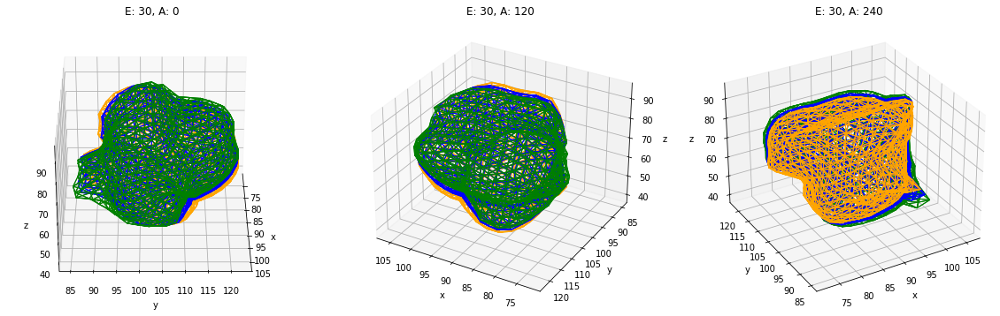

(60, 70)


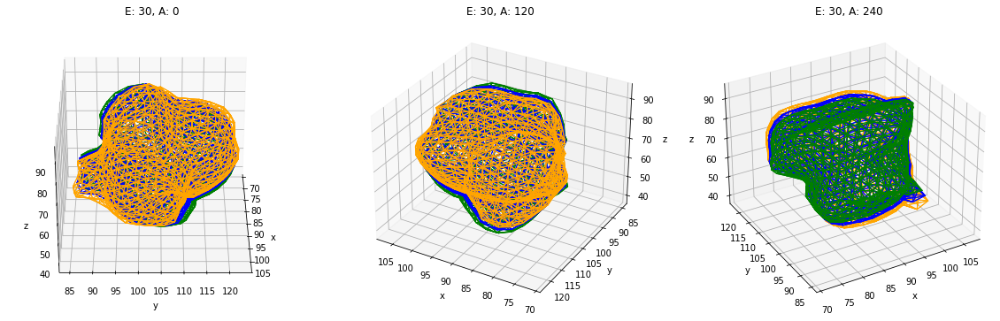

Mode: 3
(40, 50)


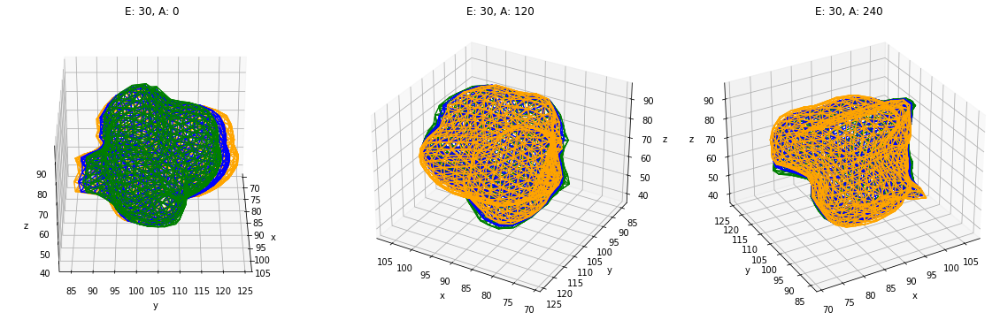

(50, 60)


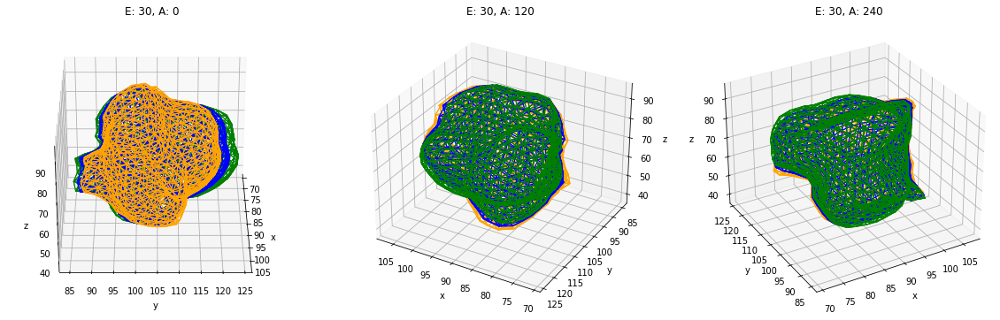

(60, 70)


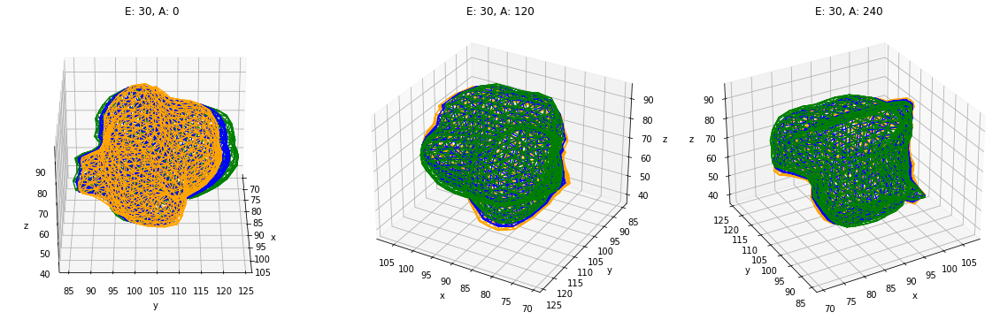

Mode: 4
(40, 50)


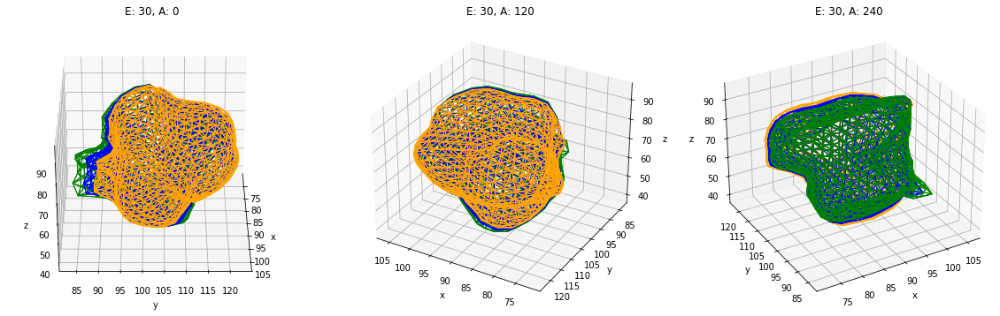

(50, 60)


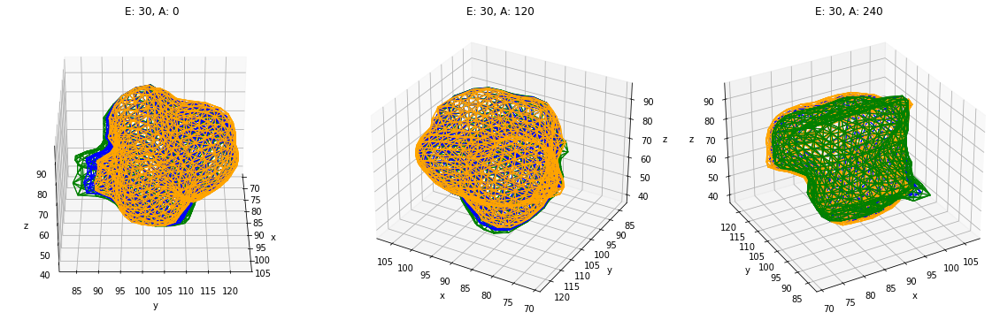

(60, 70)


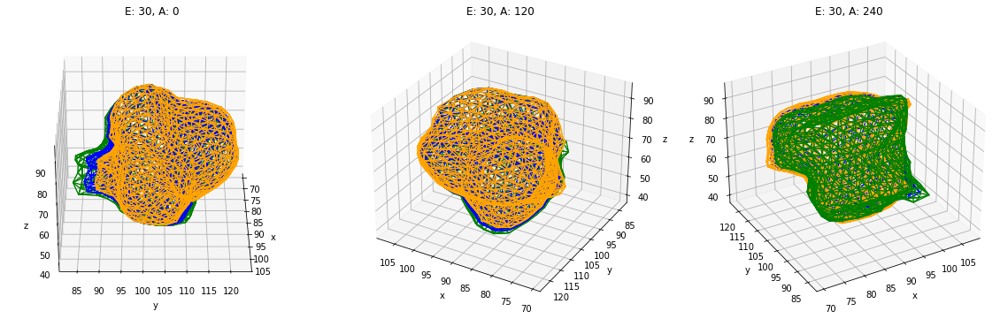

In [30]:
edge_colors = ['orange', 'blue', 'green']
labels = ['+ve', 'mean', '-ve']

for mode in range(0, 5):
    print(f'Mode: {mode}')
    for ages, model in shape_models.items():
        print(ages)
        (shape_mode_pos, shape_mode_neg) = model.mode(mode, 3)
        shape_list = np.concatenate([
            np.expand_dims(shape_mode_pos, 0),
            np.expand_dims(model.mean, 0),
            np.expand_dims(shape_mode_neg, 0),
        ])
        coma.utils.visualise.plot_wireframes(
            shape_list,
            faces,
            elevations=[30],
            azimuths=3,
            edge_colors=edge_colors,
            labels=labels,
        )

In [35]:
def plot_diff_map_in_notebook(template, diff_map):
    plotter = pv.Plotter(
        shape=(1, 4),
        window_size=(1024, 300),
        border=False,
        lighting='light_kit',
        off_screen=True,
        notebook=True,
    )
    plot_mesh_pyvista(
        plotter,
        template,
        rotations=[(0, 0, -45), (0, 0, 20), (0, 0, 85), (0, 0, 185),],
        vertexcolors=list(diff_map),
        vertexscalar='distance',
    )
    plotter.show()
    
def calculate_shape_model_diff(shape_model, mode):
    (mode_pos, _) = shape_model.mode(mode, 1)
    dist = np.sqrt(((shape_model.mean - mode_pos) ** 2).sum(axis=1))
    return dist

Mode: 1
(40, 50)


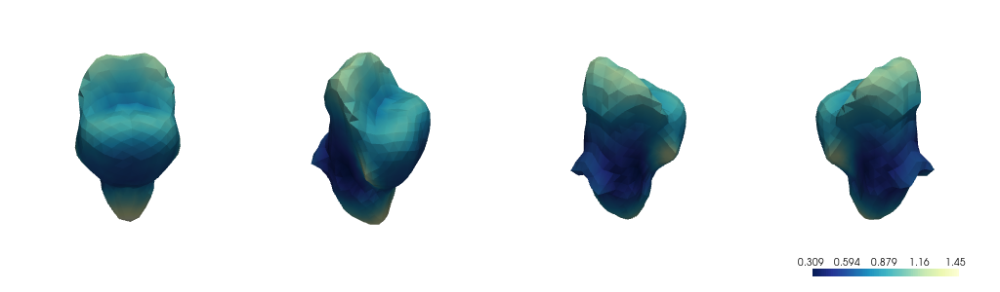

(50, 60)


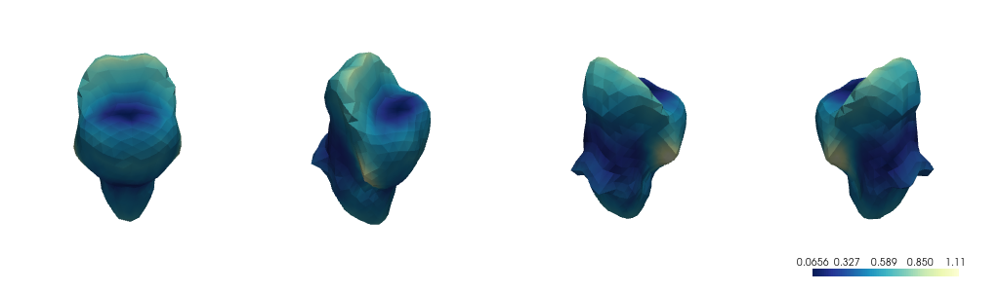

(60, 70)


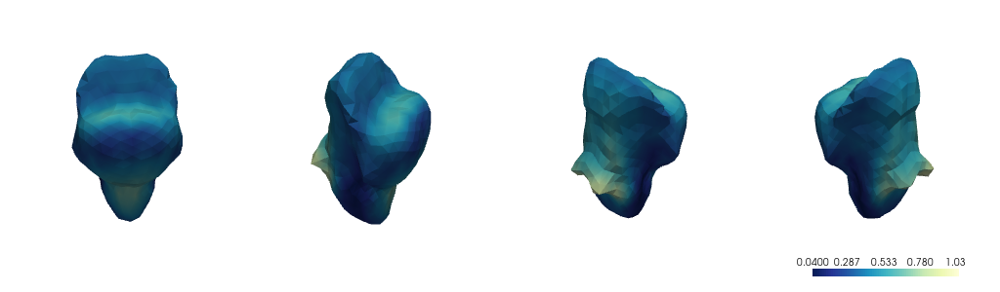

Mode: 2
(40, 50)


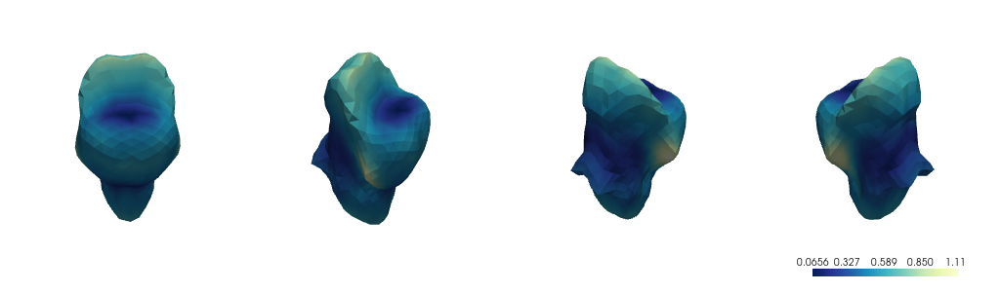

(50, 60)


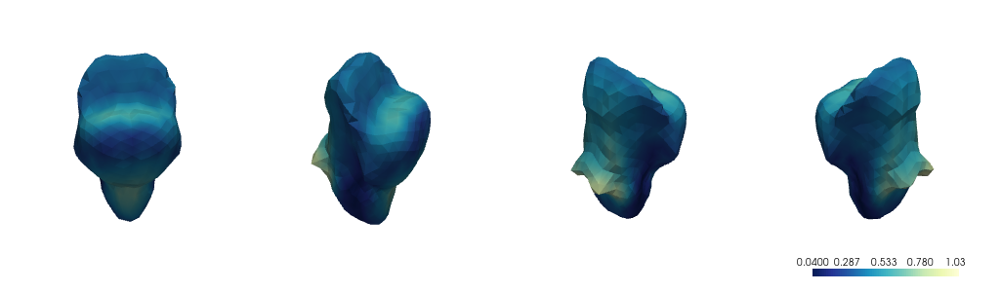

(60, 70)


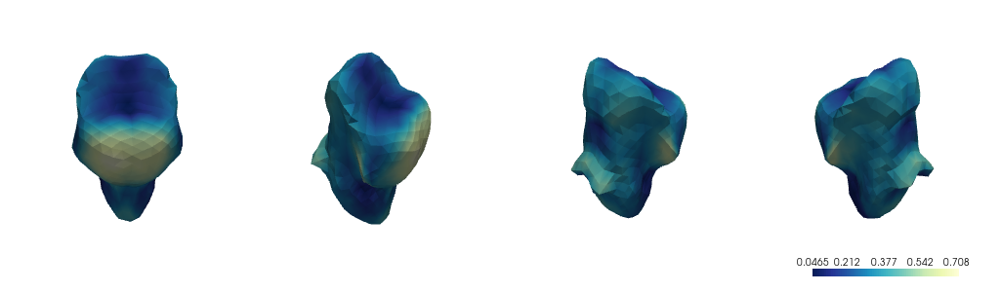

Mode: 3
(40, 50)


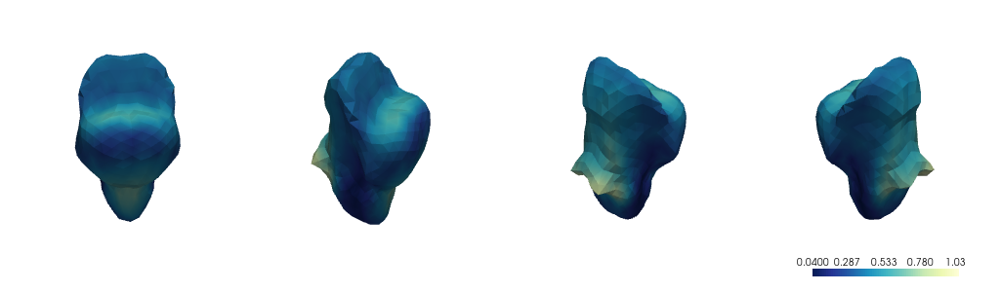

(50, 60)


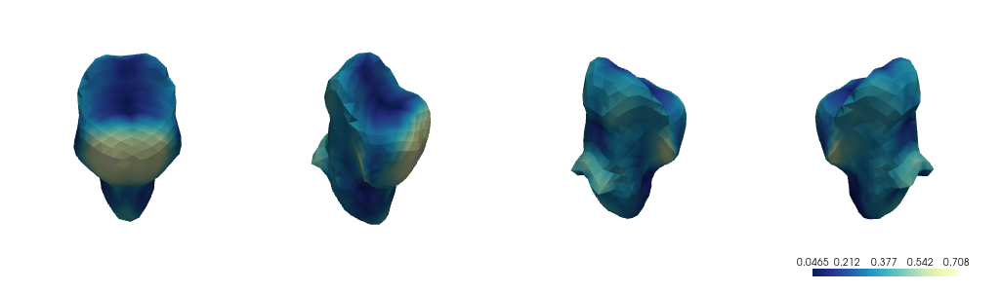

(60, 70)


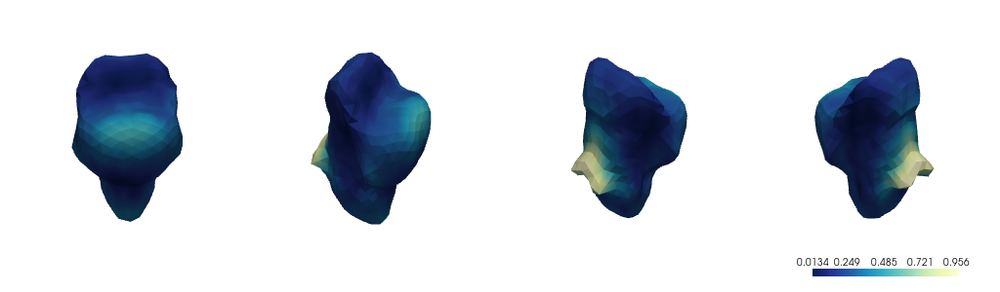

Mode: 4
(40, 50)


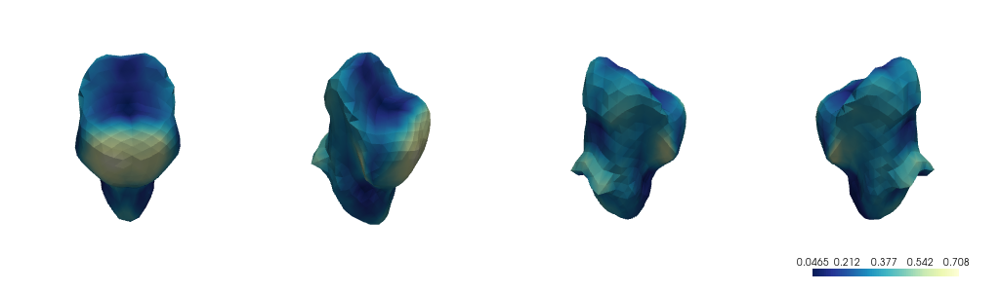

(50, 60)


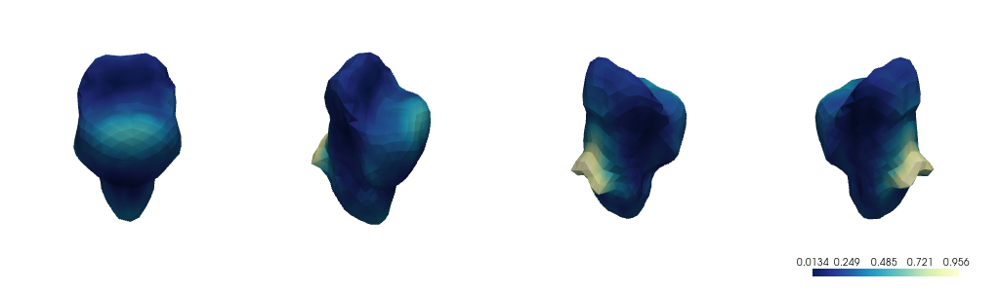

(60, 70)


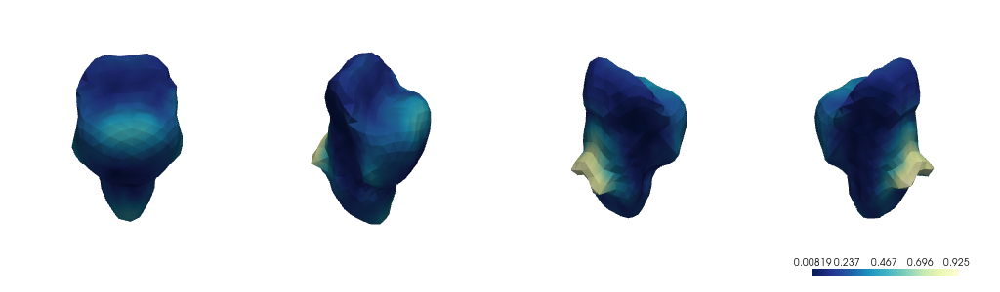

Mode: 5
(40, 50)


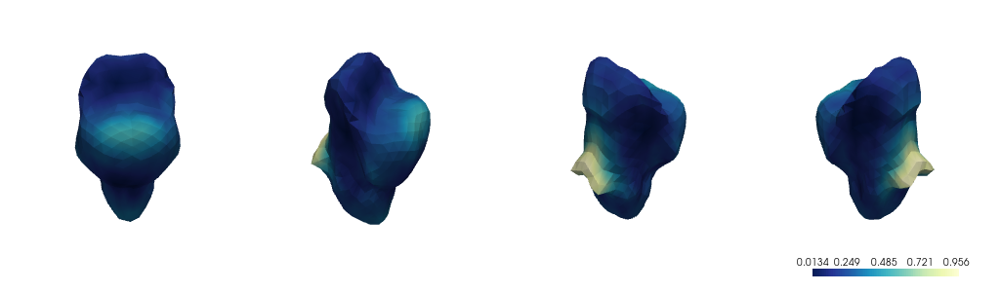

(50, 60)


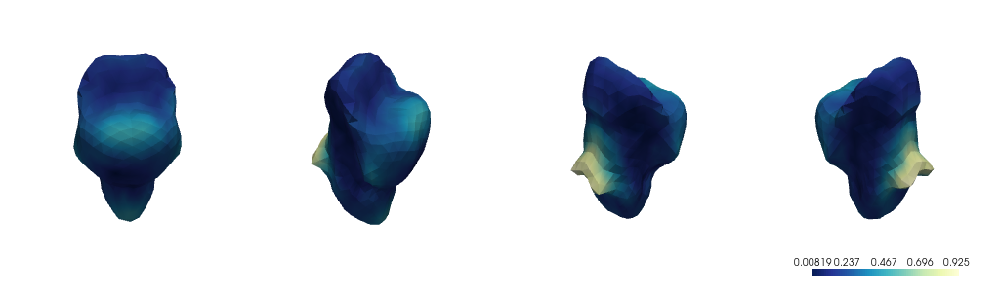

(60, 70)


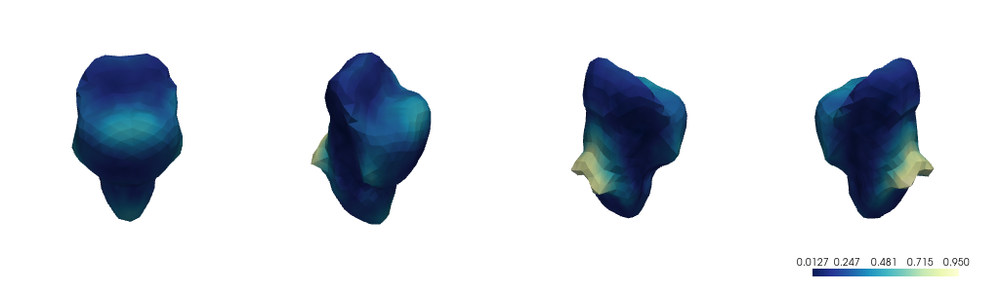

In [36]:
templates = {}
for ages, model in shape_models.items():
    template_copy = template.copy()
    template_copy.points = model.mean
    templates[ages] = template_copy

modes = 8
diff_maps = np.zeros((modes * buckets, 642))

for mode in range(0, 5):
    for i, (ages, model) in enumerate(shape_models.items()):
        diff_maps[mode + i] = calculate_shape_model_diff(model, mode)

# diff_maps = (diff_maps - diff_maps.min()) / (diff_maps.max() - diff_maps.min())

for mode in range(0, 5):
    print(f'Mode: {mode + 1}')
    for i, (ages, template) in enumerate(templates.items()):
        print(f'{ages}')
        plot_diff_map_in_notebook(template, diff_maps[mode + i])